In [23]:
# Clear all variables from the current environment
locals().clear()
globals().clear()

In [45]:
import pandas as pd # data manipulation
import numpy as np # data manipulation
import matplotlib.pyplot as plt # graphs
import seaborn as sns # graphs

import re # string manipulation
from datetime import datetime # date manipulation
from wordcloud import WordCloud # wordcloud
import nltk # NLP methods
from nltk.corpus import stopwords # NLP methods

from IPython.display import display # table format display of data
import folium # maps

import igraph # graphs

from sklearn.decomposition import LatentDirichletAllocation # for LDA topic modelling
from sklearn.feature_extraction.text import CountVectorizer # making document term matrixes
from nltk.stem.snowball import SnowballStemmer # for stemming

from nltk.classify import textcat # for language identification

In [2]:
fillColor = "#FFA07A"
fillColor2 = "#F1C40F"

# reviews = pd.read_csv('../input/yelp_review.csv')
# business = pd.read_csv('../input/yelp_business.csv')
import pickle
with open('../input/business.pkl', 'rb') as f:
    businesses = pickle.load(f)
with open('../input/review.pkl', 'rb') as f:
    reviews = pickle.load(f)

business = pd.read_json('../input/yelp_academic_dataset_business.json', lines=True)

In [3]:
# reviews = reviews.head(500)
# business = business.head(500)

In [46]:
display(businesses.head().style.set_table_styles([{'selector': '.row_heading, .blank', 'props': [('display', 'none;')]}]).set_properties(**{'text-align': 'center'}).set_table_attributes('class="table-condensed"').set_table_styles([{'selector': 'thead', 'props': [('display', 'none;')]}]).set_properties(subset=['stars'], **{'width': '80px'}).set_properties(subset=['review_count'], **{'width': '100px'}).set_properties(subset=['categories'], **{'width': '300px'}).set_properties(subset=['address'], **{'width': '300px'}))

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.000000,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturopathic/Holistic, Acupuncture, Health & Medical, Nutritionists",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.000000,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Mailbox Centers, Printing Services","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', 'Wednesday': '8:0-18:30', 'Thursday': '8:0-18:30', 'Friday': '8:0-18:30', 'Saturday': '8:0-14:0'}"
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.500000,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCreditCards': 'True', 'RestaurantsPriceRange2': '2', 'CoatCheck': 'False', 'RestaurantsTakeOut': 'False', 'RestaurantsDelivery': 'False', 'Caters': 'False', 'WiFi': ""u'no'"", 'BusinessParking': ""{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}"", 'WheelchairAccessible': 'True', 'HappyHour': 'False', 'OutdoorSeating': 'False', 'HasTV': 'False', 'RestaurantsReservations': 'False', 'DogsAllowed': 'False', 'ByAppointmentOnly': 'False'}","Department Stores, Shopping, Fashion, Home & Garden, Electronics, Furniture Stores","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', 'Wednesday': '8:0-22:0', 'Thursday': '8:0-22:0', 'Friday': '8:0-23:0', 'Saturday': '8:0-23:0', 'Sunday': '8:0-22:0'}"
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.000000,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeating': 'False', 'BusinessAcceptsCreditCards': 'False', 'BusinessParking': ""{'garage': False, 'street': True, 'validated': False, 'lot': False, 'valet': False}"", 'BikeParking': 'True', 'RestaurantsPriceRange2': '1', 'RestaurantsTakeOut': 'True', 'ByAppointmentOnly': 'False', 'WiFi': ""u'free'"", 'Alcohol': ""u'none'"", 'Caters': 'True'}","Restaurants, Food, Bubble Tea, Coffee & Tea, Bakeries","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', 'Wednesday': '7:0-20:0', 'Thursday': '7:0-20:0', 'Friday': '7:0-21:0', 'Saturday': '7:0-21:0', 'Sunday': '7:0-21:0'}"
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.500000,13,1,"{'BusinessAcceptsCreditCards': 'True', 'WheelchairAccessible': 'True', 'RestaurantsTakeOut': 'True', 'BusinessParking': ""{'garage': None, 'street': None, 'validated': None, 'lot': True, 'valet': False}"", 'BikeParking': 'True', 'GoodForKids': 'True', 'Caters': 'False'}","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-22:0', 'Friday': '12:0-22:0', 'Saturday': '12:0-22:0', 'Sunday': '12:0-18:0'}"


In [6]:
print(reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6990280 entries, 0 to 6990279
Data columns (total 9 columns):
 #   Column       Dtype  
---  ------       -----  
 0   review_id    object 
 1   user_id      object 
 2   business_id  object 
 3   stars        float64
 4   useful       int64  
 5   funny        int64  
 6   cool         int64  
 7   text         object 
 8   date         object 
dtypes: float64(1), int64(3), object(5)
memory usage: 480.0+ MB
None


In [44]:
print(businesses.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150346 entries, 0 to 150345
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   150346 non-null  object 
 1   name          150346 non-null  object 
 2   address       150346 non-null  object 
 3   city          150346 non-null  object 
 4   state         150346 non-null  object 
 5   postal_code   150346 non-null  object 
 6   latitude      150346 non-null  float64
 7   longitude     150346 non-null  float64
 8   stars         150346 non-null  float64
 9   review_count  150346 non-null  int64  
 10  is_open       150346 non-null  int64  
 11  attributes    136602 non-null  object 
 12  categories    150243 non-null  object 
 13  hours         127123 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 16.1+ MB
None


In [7]:
from langdetect import detect_langs
sample_text = reviews['text'][:10]
for text in sample_text:
    print(f"{text}\nLanguage: {detect_langs(text)}\n")

If you decide to eat here, just be aware it is going to take about 2 hours from beginning to end. We have tried it multiple times, because I want to like it! I have been to it's other locations in NJ and never had a bad experience. 

The food is good, but it takes a very long time to come out. The waitstaff is very young, but usually pleasant. We have just had too many experiences where we spent way too long waiting. We usually opt for another diner or restaurant on the weekends, in order to be done quicker.
Language: [en:0.9999958305129498]

I've taken a lot of spin classes over the years, and nothing compares to the classes at Body Cycle. From the nice, clean space and amazing bikes, to the welcoming and motivating instructors, every class is a top notch work out.

For anyone who struggles to fit workouts in, the online scheduling system makes it easy to plan ahead (and there's no need to line up way in advanced like many gyms make you do).

There is no way I can write this review wi

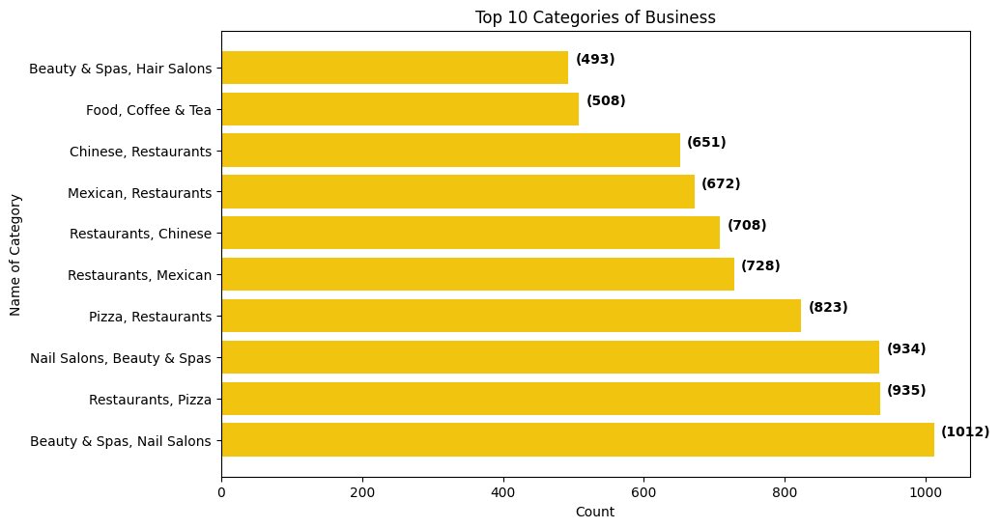

In [9]:
# Split categories by semicolon and convert to a dataframe
categories = businesses['categories'].str.split(';', expand=True).stack().reset_index(level=1, drop=True).to_frame(name='Name')

# Group by category name and count occurrences
top_categories = categories.groupby('Name').size().reset_index(name='Count').sort_values('Count', ascending=False).head(10)

# Reorder categories by count
top_categories['Name'] = pd.Categorical(top_categories['Name'], categories=top_categories['Name'][::-1])
top_categories = top_categories.sort_values('Count')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.barh(top_categories['Name'], top_categories['Count'], color='#F1C40F')
plt.gca().invert_yaxis()
for i, v in enumerate(top_categories['Count']):
    plt.text(v + 10, i - 0.1, f'({v})', color='black', fontweight='bold')
plt.title('Top 10 Categories of Business')
plt.xlabel('Count')
plt.ylabel('Name of Category')
plt.show()

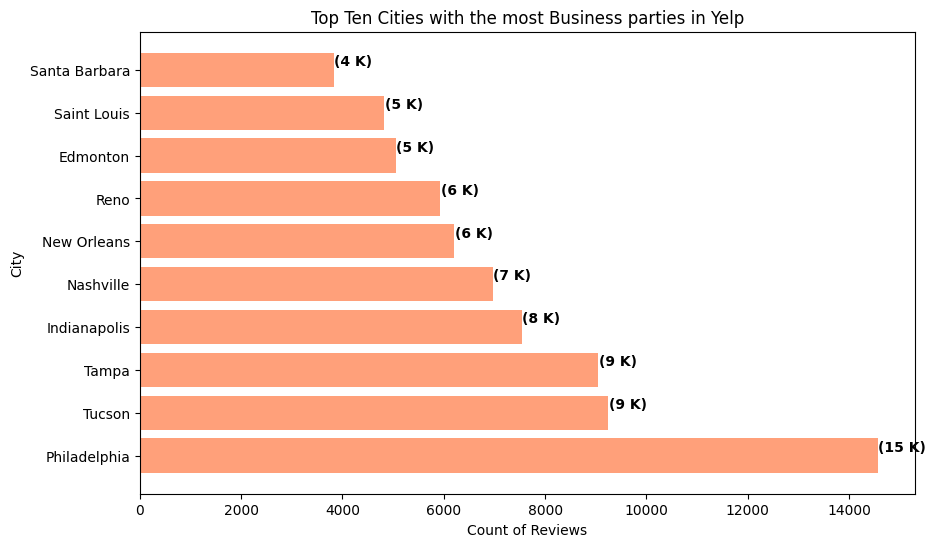

In [10]:
# Group by city and count occurrences
top_cities = businesses.groupby('city').size().reset_index(name='Count').sort_values('Count', ascending=False).head(10)

# Reorder cities by count
top_cities['city'] = pd.Categorical(top_cities['city'], categories=top_cities['city'][::-1])
top_cities = top_cities.sort_values('Count')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.barh(top_cities['city'], top_cities['Count'], color='#FFA07A')
plt.gca().invert_yaxis()
for i, v in enumerate(top_cities['Count']):
    plt.text(v + 10, i - 0.1, f'({round(v/1e3)} K)', color='black', fontweight='bold')
plt.title('Top Ten Cities with the most Business parties in Yelp')
plt.xlabel('Count of Reviews')
plt.ylabel('City')
plt.show()


In [14]:
from geopy import distance

# Filter data for Las Vegas
PhiladelphiaCoords = businesses[businesses['city'] == 'Philadelphia']

# Calculate center of map
center_lat = PhiladelphiaCoords['latitude'].median(skipna=True)
center_lon = PhiladelphiaCoords['longitude'].median(skipna=True)
print(center_lat,center_lon)

# Create map
m = folium.Map(location=[center_lat, center_lon], zoom_start=13)

# Add circles to map
for index, row in PhiladelphiaCoords.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']],
                        radius=row['review_count'] ** 0.5,
                        color='#3186cc',
                        fill=True,
                        fill_color='#3186cc').add_to(m)

# Show map
m

39.954384 -75.1610183611


In [47]:
# List of CSV file names
csv_files = [
    'yelp_academic_dataset_reviews_Phila.csv',
    'yelp_academic_dataset_reviews_Philadelphia .csv',
    'yelp_academic_dataset_reviews_Philadelphia (Northeast Philly).csv',
    'yelp_academic_dataset_reviews_Philadelphia.csv',
    'yelp_academic_dataset_reviews_Philadelphila .csv',
    'yelp_academic_dataset_reviews_Philadephia.csv',
    'yelp_academic_dataset_reviews_Philiadelphia.csv',
    'yelp_academic_dataset_reviews_Southwest Philadelphia.csv'
]

# Read each CSV file and store the DataFrames in a list
dataframes = [pd.read_csv(f'../processed/{file}') for file in csv_files]

# Combine all the DataFrames into one DataFrame
philadelphia_reviews = pd.concat(dataframes, axis=0, ignore_index=True)

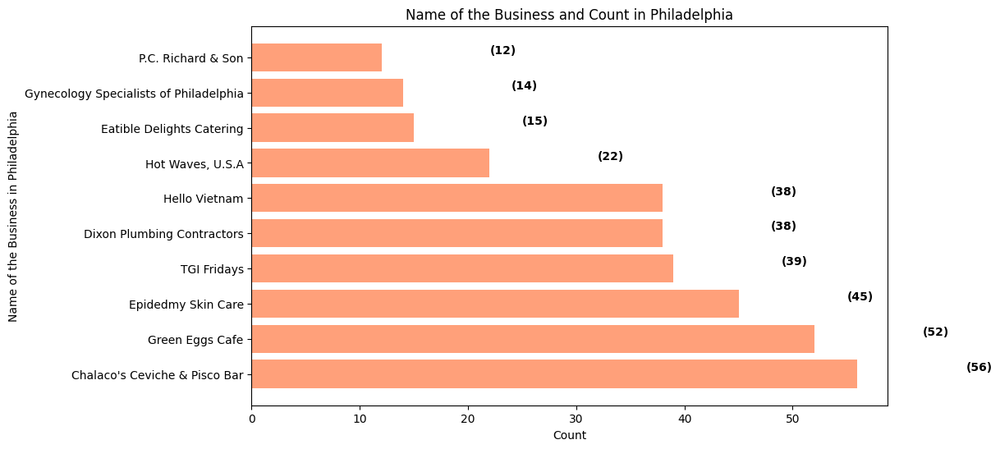

In [48]:
# Filter reviews for 5-star ratings and count occurrences for each business
most5StarsReviews = philadelphia_reviews[philadelphia_reviews['stars'] == 5].groupby('business_id').size().reset_index(name='Count').sort_values('Count', ascending=False).head(10)

# Reorder businesses by count
most5StarsReviews['business_id'] = pd.Categorical(most5StarsReviews['business_id'], categories=most5StarsReviews['business_id'][::-1])
most5StarsReviews = most5StarsReviews.sort_values('Count')

# Join with business data to get business name
most5StarsReviews = pd.merge(most5StarsReviews, businesses[['business_id', 'name']], on='business_id', how='inner')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.barh(most5StarsReviews['name'], most5StarsReviews['Count'], color='#FFA07A')
plt.gca().invert_yaxis()
for i, v in enumerate(most5StarsReviews['Count']):
    plt.text(v + 10, i - 0.1, f'({v})', color='black', fontweight='bold')
plt.title('Name of the Business and Count in Philadelphia')
plt.xlabel('Count')
plt.ylabel('Name of the Business in Philadelphia')
plt.show()

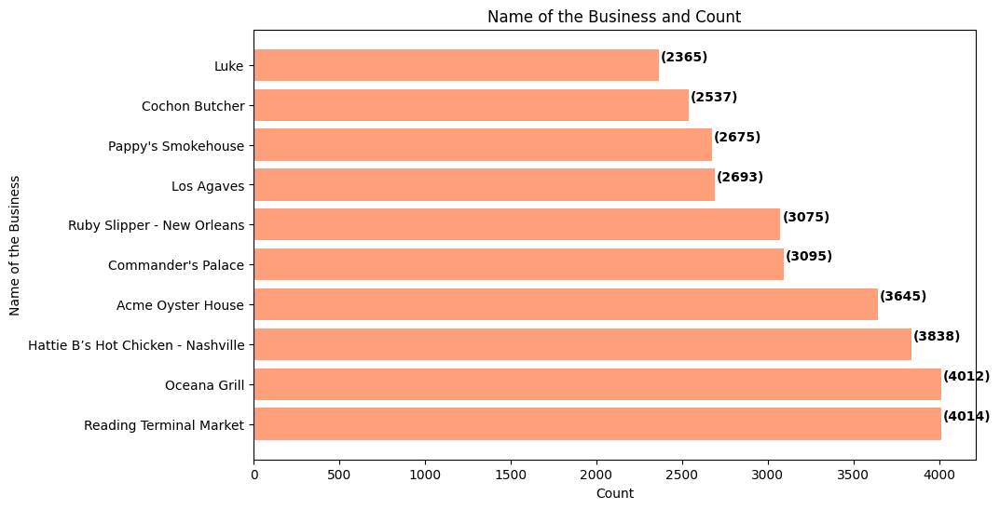

In [49]:
# Filter reviews for 5-star ratings and count occurrences for each business
most5StarsReviews = reviews[reviews['stars'] == 5].groupby('business_id').size().reset_index(name='Count').sort_values('Count', ascending=False).head(10)

# Reorder businesses by count
most5StarsReviews['business_id'] = pd.Categorical(most5StarsReviews['business_id'], categories=most5StarsReviews['business_id'][::-1])
most5StarsReviews = most5StarsReviews.sort_values('Count')

# Join with business data to get business name
most5StarsReviews = pd.merge(most5StarsReviews, businesses[['business_id', 'name']], on='business_id', how='inner')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.barh(most5StarsReviews['name'], most5StarsReviews['Count'], color='#FFA07A')
plt.gca().invert_yaxis()
for i, v in enumerate(most5StarsReviews['Count']):
    plt.text(v + 10, i - 0.1, f'({v})', color='black', fontweight='bold')
plt.title('Name of the Business and Count')
plt.xlabel('Count')
plt.ylabel('Name of the Business')
plt.show()

In [26]:
most5StarsReviews

,business_id,Count,name
0,GBTPC53ZrG1ZBY3DT8Mbcw,2365,Luke
1,gTC8IQ_i8zXytWSly3Ttvg,2537,Cochon Butcher
2,I_3LMZ_1m2mzR0oLIOePIg,2675,Pappy's Smokehouse
3,yPSejq3_erxo9zdVYTBnZA,2693,Los Agaves
4,oBNrLz4EDhiscSlbOl8uAw,3075,Ruby Slipper - New Orleans
5,_C7QiQQc47AOEv4PE3Kong,3095,Commander's Palace
6,_ab50qdWOk0DdB6XOrBitw,3645,Acme Oyster House
7,GXFMD0Z4jEVZBCsbPf4CTQ,3838,Hattie B’s Hot Chicken - Nashville
8,ac1AeYqs8Z4_e2X5M3if2A,4012,Oceana Grill
9,ytynqOUb3hjKeJfRj5Tshw,4014,Reading Terminal Market


In [35]:
for review in most5StarsReviews['business_id']:
    print(review)
    print(businesses[businesses['business_id'] == review][['name', 'city', 'state', 'postal_code', 'categories']])

GBTPC53ZrG1ZBY3DT8Mbcw
      name         city state postal_code  \
4497  Luke  New Orleans    LA       70130   

                                             categories  
4497  German, Restaurants, Seafood, Cocktail Bars, F...  
gTC8IQ_i8zXytWSly3Ttvg
                 name         city state postal_code  \
49618  Cochon Butcher  New Orleans    LA       70130   

                                              categories  
49618  Shopping, Butcher, Restaurants, Sandwiches, Fo...  
I_3LMZ_1m2mzR0oLIOePIg
                      name         city state postal_code  \
132673  Pappy's Smokehouse  Saint Louis    MO       63103   

                                               categories  
132673  Food, Restaurants, Caterers, Smokehouse, Barbe...  
yPSejq3_erxo9zdVYTBnZA
              name           city state postal_code            categories
129349  Los Agaves  Santa Barbara    CA       93101  Mexican, Restaurants
oBNrLz4EDhiscSlbOl8uAw
                              name         city state po

In [21]:
import dtale
# Filter for Parc and select relevant columns
ReadingTerminalMarket = businesses[businesses['business_id'] == 'ytynqOUb3hjKeJfRj5Tshw'][['name', 'city', 'state', 'postal_code', 'categories']]

# Display table using dtale
dtale.show(ReadingTerminalMarket)

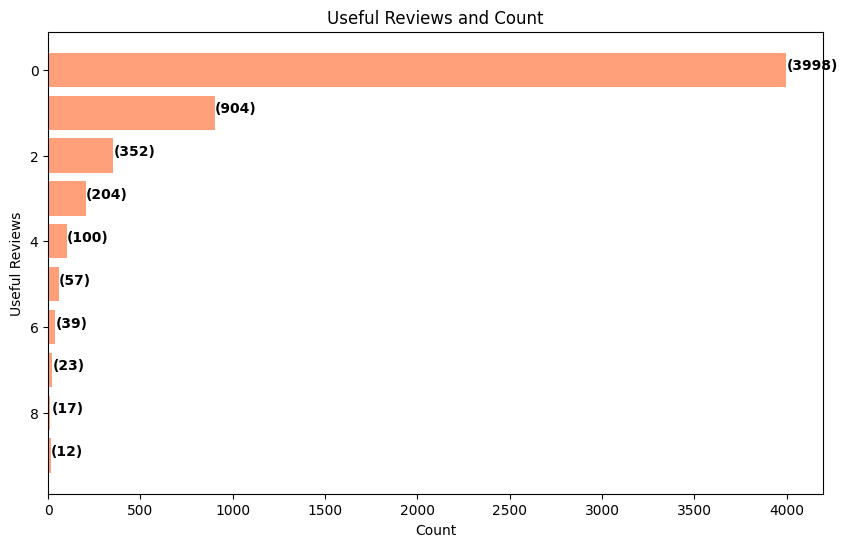

In [50]:
# Filter for Mon Ami Gabi reviews
mon_ami_gabi_reviews = reviews[reviews['business_id'] == 'ytynqOUb3hjKeJfRj5Tshw']

# Group by useful and count occurrences
useful_reviews = mon_ami_gabi_reviews.groupby('useful').size().reset_index(name='Count').sort_values('Count', ascending=False).head(10)

# Reorder reviews by count
useful_reviews['useful'] = pd.Categorical(useful_reviews['useful'], categories=useful_reviews['useful'][::-1])
useful_reviews = useful_reviews.sort_values('Count')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.barh(useful_reviews['useful'], useful_reviews['Count'], color='#FFA07A')
plt.gca().invert_yaxis()
for i, v in enumerate(useful_reviews['Count']):
    plt.text(v + 1, 9 - i, f'({v})', color='black', fontweight='bold')
plt.title('Useful Reviews and Count')
plt.xlabel('Count')
plt.ylabel('Useful Reviews')
plt.show()

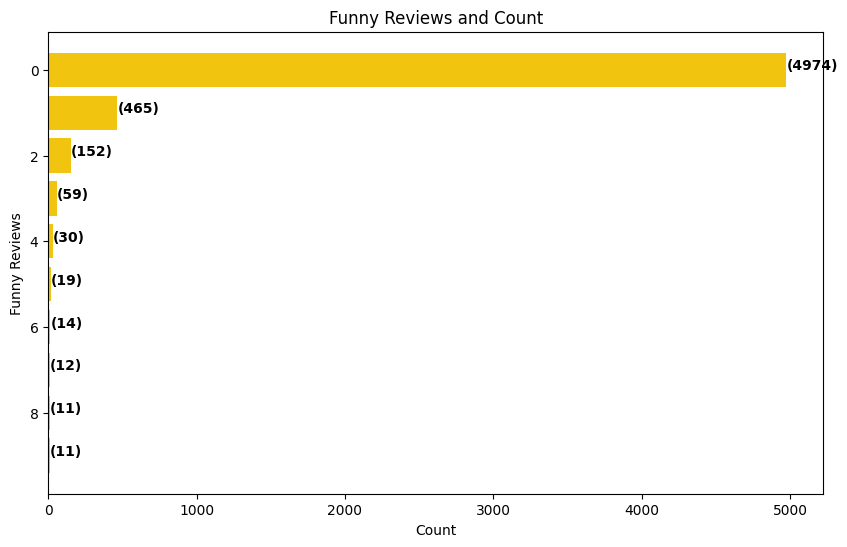

In [51]:
# Filter for Mon Ami Gabi reviews
mon_ami_gabi_reviews = reviews[reviews['business_id'] == 'ytynqOUb3hjKeJfRj5Tshw']

# Group by funny and count occurrences
funny_reviews = mon_ami_gabi_reviews.groupby('funny').size().reset_index(name='Count').sort_values('Count', ascending=False).head(10)

# Reorder reviews by count
funny_reviews['funny'] = pd.Categorical(funny_reviews['funny'], categories=funny_reviews['funny'][::-1])
funny_reviews = funny_reviews.sort_values('Count')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.barh(funny_reviews['funny'], funny_reviews['Count'], color='#F1C40F')
plt.gca().invert_yaxis()
for i, v in enumerate(funny_reviews['Count']):
    plt.text(v + 1, 9-i, f'({v})', color='black', fontweight='bold')
plt.title('Funny Reviews and Count')
plt.xlabel('Count')
plt.ylabel('Funny Reviews')
plt.show()

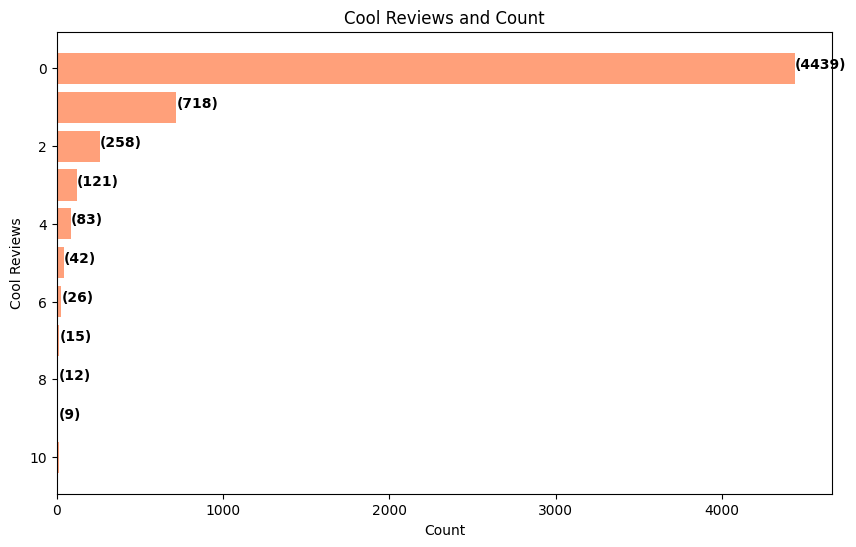

In [52]:
# Filter for Mon Ami Gabi reviews
mon_ami_gabi_reviews = reviews[reviews['business_id'] == 'ytynqOUb3hjKeJfRj5Tshw']

# Group by cool and count occurrences
cool_reviews = mon_ami_gabi_reviews.groupby('cool').size().reset_index(name='Count').sort_values('Count', ascending=False).head(10)

# Reorder reviews by count
cool_reviews['cool'] = pd.Categorical(cool_reviews['cool'], categories=cool_reviews['cool'][::-1])
cool_reviews = cool_reviews.sort_values('Count')

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.barh(cool_reviews['cool'], cool_reviews['Count'], color='#FFA07A')
plt.gca().invert_yaxis()
for i, v in enumerate(cool_reviews['Count']):
    plt.text(v + 1, 9-i, f'({v})', color='black', fontweight='bold')
plt.title('Cool Reviews and Count')
plt.xlabel('Count')
plt.ylabel('Cool Reviews')
plt.show()

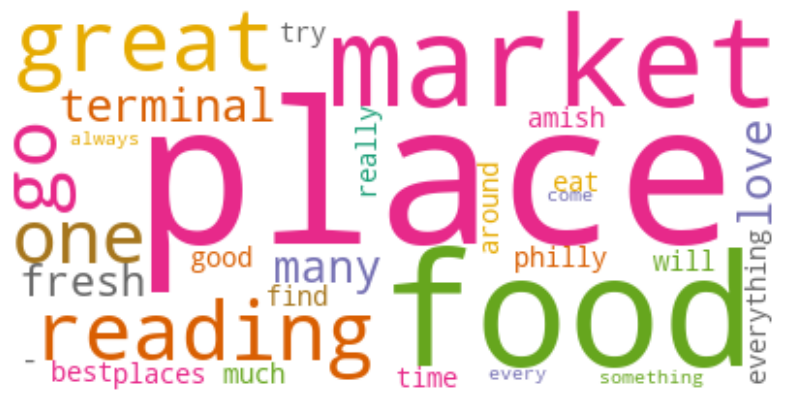

In [53]:
from wordcloud import WordCloud, STOPWORDS

# Define function to create word cloud
def create_word_cloud(train):
    # Tokenize text and remove stop words
    words = train['text'].str.cat(sep=' ')
    stop_words = set(STOPWORDS)
    word_tokens = [word.lower() for word in words.split() if word.lower() not in stop_words]
    
    # Count word frequencies and create word cloud
    word_counts = pd.Series(word_tokens).value_counts().head(30)
    wordcloud = WordCloud(max_words=30, background_color='white', colormap='Dark2').generate_from_frequencies(word_counts)
    
    # Display word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Create word cloud for Mon Ami Gabi reviews
mon_ami_gabi_reviews = reviews[reviews['business_id'] == 'ytynqOUb3hjKeJfRj5Tshw']
create_word_cloud(mon_ami_gabi_reviews)

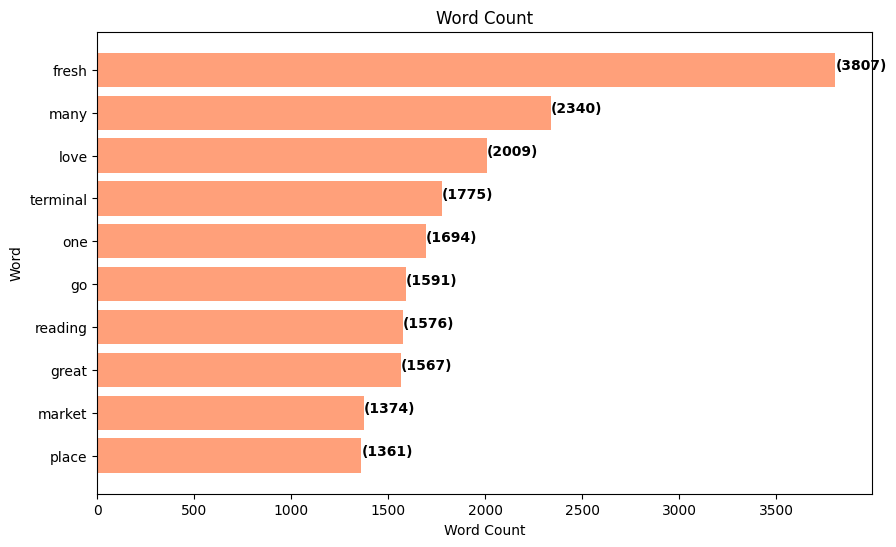

In [54]:
# Define function to create bar plot
def create_bar_plot(train):
    # Tokenize text and remove stop words
    words = train['text'].str.cat(sep=' ')
    stop_words = set(STOPWORDS)
    stop_words.update(['food', 'restaurant'])
    word_tokens = [word.lower() for word in words.split() if word.lower() not in stop_words]
    
    # Count word frequencies and create bar plot
    word_counts = pd.Series(word_tokens).value_counts().head(10)
    word_counts.index = np.flip(word_counts.index)
    plt.figure(figsize=(10, 6))
    plt.barh(word_counts.index, word_counts.values, color=fillColor)
    for i, v in enumerate(word_counts.values):
        plt.text(v, i, f'({v})', color='black', fontweight='bold')
    plt.xlabel('Word Count')
    plt.ylabel('Word')
    plt.title('Word Count')
    plt.gca().invert_yaxis()
    plt.show()

# Create bar plot for Mon Ami Gabi reviews
mon_ami_gabi_reviews = reviews[reviews['business_id'] == 'ytynqOUb3hjKeJfRj5Tshw']
create_bar_plot(mon_ami_gabi_reviews)

In [22]:
# !pip install textblob

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 636.8/636.8 kB 1.6 MB/s eta 0:00:004.5 MB/s eta 0:00:01


In [32]:
# Download the necessary NLTK resources if not already downloaded
# nltk.download('punkt')
# nltk.download('stopwords')

[nltk_data] Downloading package punkt to /Users/cynthiali/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/cynthiali/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

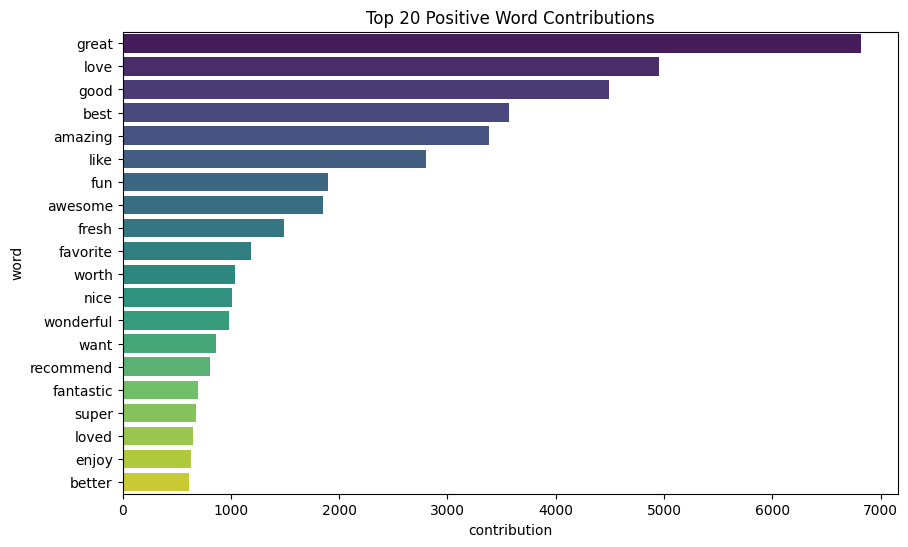

In [55]:
from nltk.tokenize import word_tokenize
def positive_words_bar_graph(df, business_id):
    # Filter the DataFrame by business_id
    SC = df[df['business_id'] == business_id]

    # Tokenize words and create a DataFrame with the words and their count
    words = []
    for text in SC['text']:
        words.extend(word_tokenize(text.lower()))
    words_count = pd.DataFrame(pd.Series(words).value_counts(), columns=['occurences']).reset_index().rename(columns={'index': 'word'})

    # Load AFINN sentiment lexicon
    afinn = pd.read_csv('https://raw.githubusercontent.com/fnielsen/afinn/master/afinn/data/AFINN-111.txt', sep='\t', header=None, names=['word', 'score'])

    # Merge words_count with afinn sentiment lexicon
    contributions = words_count.merge(afinn, on='word', how='inner')
    contributions['contribution'] = contributions['occurences'] * contributions['score']

    # Filter top 20 words by contribution and plot the bar graph
    top_20_contributions = contributions.nlargest(20, 'contribution')
    plt.figure(figsize=(10, 6))
    bar_plot = sns.barplot(data=top_20_contributions, y='word', x='contribution', palette='viridis')
    plt.title('Top 20 Positive Word Contributions')
    plt.show()

# Call the function with your DataFrame and business_id
positive_words_bar_graph(reviews, "ytynqOUb3hjKeJfRj5Tshw")

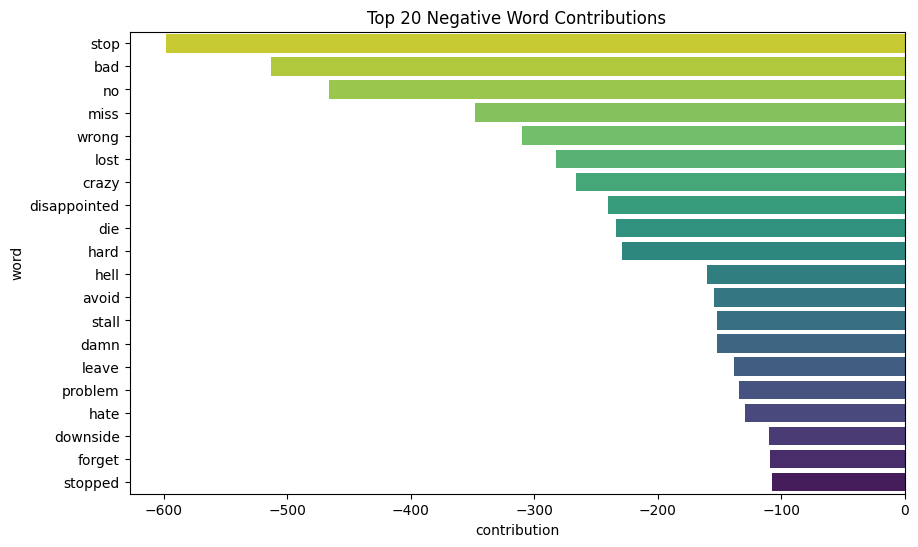

In [56]:
def negative_words_bar_graph(df, business_id):
    # Filter the DataFrame by business_id
    SC = df[df['business_id'] == business_id]

    # Tokenize words and create a DataFrame with the words and their count
    words = []
    for text in SC['text']:
        words.extend(word_tokenize(text.lower()))
    words_count = pd.DataFrame(pd.Series(words).value_counts(), columns=['occurences']).reset_index().rename(columns={'index': 'word'})

    # Load AFINN sentiment lexicon
    afinn = pd.read_csv('https://raw.githubusercontent.com/fnielsen/afinn/master/afinn/data/AFINN-111.txt', sep='\t', header=None, names=['word', 'score'])

    # Merge words_count with afinn sentiment lexicon
    contributions = words_count.merge(afinn, on='word', how='inner')
    contributions['contribution'] = contributions['occurences'] * contributions['score']

    # Filter top 20 words by contribution and plot the bar graph (change nlargest to nsmallest for negative words)
    top_20_contributions = contributions.nsmallest(20, 'contribution')
    plt.figure(figsize=(10, 6))
    bar_plot = sns.barplot(data=top_20_contributions, y='word', x='contribution', palette='viridis_r')
    plt.title('Top 20 Negative Word Contributions')
    plt.show()

# Call the function with your DataFrame and business_id
negative_words_bar_graph(reviews, "ytynqOUb3hjKeJfRj5Tshw")

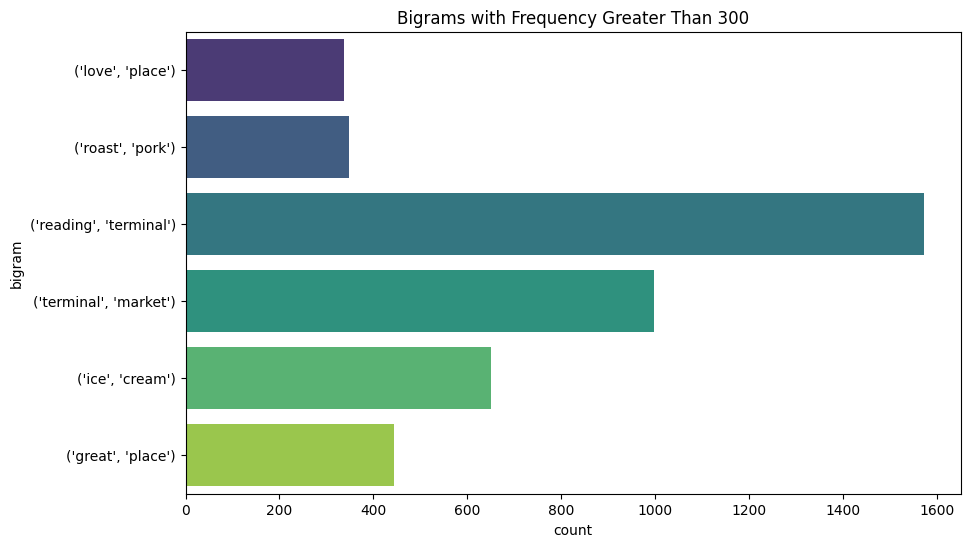

In [57]:
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder

def count_bigrams(df, business_id):
    # Filter the DataFrame by business_id
    df = df[df['business_id'] == business_id]

    # Tokenize words and remove stopwords
    words = []
    stop_words = set(stopwords.words('english'))
    for text in df['text']:
        tokenized_text = word_tokenize(text.lower())
        filtered_text = [word for word in tokenized_text if word not in stop_words and word.isalpha()]
        words.extend(filtered_text)

    # Calculate bigrams
    bigram_measures = BigramAssocMeasures()
    finder = BigramCollocationFinder.from_words(words)
    bigrams = finder.ngram_fd.items()

    # Create a DataFrame with bigrams and their count
    bigrams_df = pd.DataFrame([(bigram, count) for bigram, count in bigrams], columns=['bigram', 'count'])
    
    return bigrams_df

def visualize_bigrams(bigrams_df, threshold=50):
    # Filter bigrams with a count greater than the threshold
    filtered_bigrams = bigrams_df[bigrams_df['count'] > threshold]

    # Plot the bigrams
    plt.figure(figsize=(10, 6))
    sns.barplot(data=filtered_bigrams, x='count', y='bigram', palette='viridis')
    plt.title('Bigrams with Frequency Greater Than {}'.format(threshold))
    plt.show()

# Calculate bigrams for the specified business_id
bigrams_mon_ami_gabi = count_bigrams(reviews, "ytynqOUb3hjKeJfRj5Tshw")

# Visualize the bigrams with a frequency greater than 500
visualize_bigrams(bigrams_mon_ami_gabi, 300)

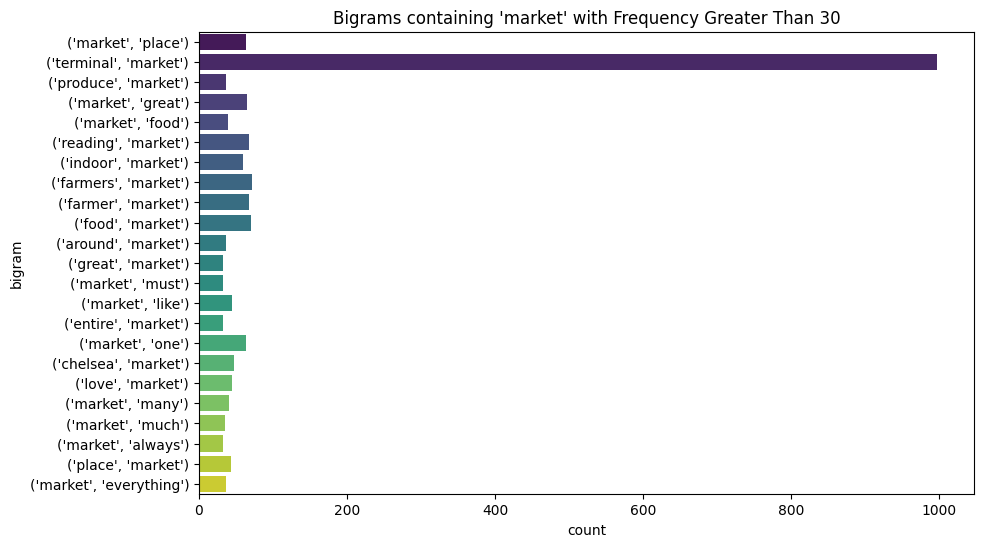

In [59]:
def count_bigrams(df, business_id):
    # Filter the DataFrame by business_id
    df = df[df['business_id'] == business_id]

    # Tokenize words and remove stopwords
    words = []
    stop_words = set(stopwords.words('english'))
    for text in df['text']:
        tokenized_text = word_tokenize(text.lower())
        filtered_text = [word for word in tokenized_text if word not in stop_words and word.isalpha()]
        words.extend(filtered_text)

    # Calculate bigrams
    bigram_measures = BigramAssocMeasures()
    finder = BigramCollocationFinder.from_words(words)
    bigrams = finder.ngram_fd.items()

    # Create a DataFrame with bigrams and their count
    bigrams_df = pd.DataFrame([(bigram, count) for bigram, count in bigrams], columns=['bigram', 'count'])
    
    return bigrams_df

def visualize_bigrams(bigrams_df, word="steak", threshold=30):
    # Filter bigrams that contain the specified word and have a count greater than the threshold
    filtered_bigrams = bigrams_df[(bigrams_df['bigram'].apply(lambda x: word in x)) & (bigrams_df['count'] > threshold)]

    # Plot the bigrams
    plt.figure(figsize=(10, 6))
    sns.barplot(data=filtered_bigrams, x='count', y='bigram', palette='viridis')
    plt.title(f"Bigrams containing '{word}' with Frequency Greater Than {threshold}")
    plt.show()

# Calculate bigrams for the specified business_id
bigrams_mon_ami_gabi = count_bigrams(reviews, "ytynqOUb3hjKeJfRj5Tshw")

# Visualize the bigrams that contain "steak" with a frequency greater than 30
visualize_bigrams(bigrams_mon_ami_gabi, word="market", threshold=30)

In [59]:
# !pip install datatable

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 164.1 kB/s eta 0:00:00m eta 0:00:010:00:02


In [62]:
def top_businesses(df, city, top_n=10):
    city_biz = df[df['city'] == city].sort_values(by=['review_count', 'stars'], ascending=False).loc[:, ['name', 'address', 'review_count', 'stars']].head(top_n)
    return city_biz

city_biz = top_businesses(businesses, "Philadelphia")

# Display the top 10 businesses in Phoenix
display(city_biz)

,name,address,review_count,stars
143157,Reading Terminal Market,51 N 12th St,5721,4.5
113983,Pat's King of Steaks,1237 E Passyunk Ave,4250,3.0
57332,Geno's Steaks,1219 S 9th St,3401,2.5
131670,El Vez,121 S 13th St,3187,4.0
31165,Zahav,237 St James Pl,3065,4.5
64928,Barbuzzo,110 S 13th St,2893,4.5
20078,Parc,227 S 18th St,2761,4.0
53452,Jim's South St,400 S St,2736,3.5
36746,Dalessandro’s Steaks & Hoagies,600 Wendover St,2686,4.0
149325,Green Eggs Café,212 S 13th St,2679,4.0


In [73]:
# !pip install sklearn

  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [18 lines of output]
      The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
      rather than 'sklearn' for pip commands.
      
      Here is how to fix this error in the main use cases:
      - use 'pip install scikit-learn' rather than 'pip install sklearn'
      - replace 'sklearn' by 'scikit-learn' in your pip requirements files
        (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
      - if the 'sklearn' package is used by one of your dependencies,
        it would be great if you take some time to track which package uses
        'sklearn' instead of 'scikit-learn' and report it to their issue tracker
      - as a last resort, set the environment variable
        SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
      
      More information is available at
      https://g

In [63]:
from sklearn.feature_extraction.text import CountVectorizer

In [65]:
def create_lda_topics(city_words, custom_stop_words, n_topics=10):
    # Remove custom stop words from the text
    for stop_word in custom_stop_words['word']:
        city_words['text'] = city_words['text'].str.replace(fr'\b{stop_word}\b', '', case=False)

    # Vectorize the text using CountVectorizer
    vectorizer = CountVectorizer(stop_words='english', max_df=0.95, min_df=2)
    dtm = vectorizer.fit_transform(city_words['text'])

    # Fit the LDA model
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(dtm)

    # Print the topics
    for idx, topic in enumerate(lda.components_):
        print(f"Topic {idx + 1}:")
        print(" ".join([vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-11:-1]]))
        print("\n")

city_coords = businesses[businesses['city'] == 'Philadelphia']
city_words = city_coords.merge(reviews, on='business_id')[['date', 'text', 'review_id']].sample(10000, random_state=42)

custom_stop_words = pd.DataFrame({'word': ['restaurant', 'food']})

create_lda_topics(city_words, custom_stop_words)

/var/folders/gh/vymqxcwd2rn5wpkdmfjdh2g40000gn/T/ipykernel_1930/301357090.py:4: FutureWarning:

The default value of regex will change from True to False in a future version.



Topic 1:
place like city good ve just philadelphia love service philly


Topic 2:
sandwich cheese place good great fries philly best cheesesteak burger


Topic 3:
good service great menu ordered meal dinner came dish dishes


Topic 4:
like just don time place people said went philly want


Topic 5:
chicken sauce good sushi rice soup fried spicy ordered noodles


Topic 6:
great time hair really did just like experience place ve


Topic 7:
good like place really coffee delicious just got cream great


Topic 8:
great place good bar beer pizza like really just drinks


Topic 9:
place time hotel parking good room day don great staff


Topic 10:
order minutes time service told said just ordered got asked




In [67]:
from textblob import TextBlob
import folium
from folium.plugins import HeatMap

# Filter businesses in Philadelphia
philadelphia_businesses = businesses[businesses['city'] == 'Philadelphia']

# Merge reviews and businesses dataframes
merged_data = pd.merge(reviews, philadelphia_businesses, on='business_id', how='inner')

# Perform sentiment analysis
merged_data['sentiment'] = merged_data['text'].apply(lambda text: TextBlob(text).sentiment.polarity)

# Get latitude, longitude, and sentiment values
locations_sentiments = merged_data[['latitude', 'longitude', 'sentiment']].values.tolist()

# Initialize the folium map centered at Philadelphia
philly_map = folium.Map(location=[39.952583, -75.165222], zoom_start=12)

# Create and add the heatmap layer
heatmap = HeatMap(locations_sentiments, radius=15, max_zoom=12)
heatmap.add_to(philly_map)

# Save the heatmap to an HTML file
philly_map.save("../result/philadelphia_sentiment_heatmap.html")

In [68]:
# Filter businesses in Philadelphia
philadelphia_businesses = businesses[businesses['city'] == 'Philadelphia']

# Merge reviews and businesses dataframes
merged_data = pd.merge(reviews, philadelphia_businesses, on='business_id', how='inner')

# Perform sentiment analysis
merged_data['sentiment'] = merged_data['text'].apply(lambda text: TextBlob(text).sentiment.polarity)

# Compute the correlation matrix
correlation_matrix = merged_data.corr()

print(correlation_matrix)

               stars_x    useful     funny      cool  latitude  longitude  \
stars_x       1.000000 -0.072018 -0.056391  0.068729 -0.028918   0.003808   
useful       -0.072018  1.000000  0.612075  0.767373  0.011554   0.003189   
funny        -0.056391  0.612075  1.000000  0.680370 -0.012490   0.001404   
cool          0.068729  0.767373  0.680370  1.000000 -0.023319  -0.005743   
latitude     -0.028918  0.011554 -0.012490 -0.023319  1.000000   0.429269   
longitude     0.003808  0.003189  0.001404 -0.005743  0.429269   1.000000   
stars_y       0.481507 -0.035061 -0.032103  0.043554 -0.055750   0.009110   
review_count  0.069975 -0.057775 -0.010558 -0.005952 -0.155704  -0.028038   
is_open       0.054480  0.003086 -0.006058  0.003034  0.032614   0.032444   
sentiment     0.597758 -0.094464 -0.077436 -0.004034 -0.020484   0.005570   

               stars_y  review_count   is_open  sentiment  
stars_x       0.481507      0.069975  0.054480   0.597758  
useful       -0.035061     -0.05